In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

import sys
import os
sys.path.append(os.path.dirname(os.getcwd()))
from database.connection import get_db_manager

In [3]:
# CONFIGURACIÓN
LEAGUES_BIG5 = [
    'ENG-Premier League',
    'ESP-La Liga',
    'ITA-Serie A',
    'GER-Bundesliga',
    'FRA-Ligue 1'
]
LEAGUE_PRIMEIRA = 'POR-Primeira Liga'
SEASON = '2425'
MIN_MINUTES = 600

os.makedirs('figures', exist_ok=True)

In [4]:
# Funciones auxiliares
def extract_metrics(df, col_name):
    result = pd.DataFrame(index=df.index)
    
    all_keys = set()
    for _, row in df.iterrows():
        if isinstance(row[col_name], dict):
            all_keys.update(row[col_name].keys())
    
    for key in all_keys:
        values = []
        for _, row in df.iterrows():
            if isinstance(row[col_name], dict) and key in row[col_name]:
                raw_value = row[col_name][key]
                converted_value = _convert_to_float(raw_value)
                values.append(converted_value)
            else:
                values.append(np.nan)
        
        valid_count = pd.Series(values).notna().sum()
        if valid_count >= 5:
            result[key] = values
    
    return result

def _convert_to_float(value):
    if isinstance(value, (int, float)):
        return float(value)
    if value is None or pd.isna(value):
        return np.nan
    if isinstance(value, str):
        if value.strip() == '' or value.lower().strip() in ['nan', 'none', 'null', '-']:
            return np.nan
        try:
            return float(value)
        except (ValueError, TypeError):
            return np.nan
    return np.nan

def clean_series_values(df):
    for col in df.columns:
        series_mask = df[col].apply(lambda x: isinstance(x, pd.Series))
        if series_mask.any():
            print(f"Limpiando Series en: {col}")
            df[col] = df[col].apply(
                lambda x: x.iloc[0] if isinstance(x, pd.Series) and not x.empty else x
            )
    return df

# Métricas a excluir de per90
exclude_per90 = {
    'pass_completion_pct', 'shots_on_target_pct', 'Take-Ons_Succ%', 'Take-Ons_Tkld%',
    'Aerial Duels_Won%', 'Challenges_Tkl%', 'Save%', 'Launched_Cmp%', 'Crosses_Stp%',
    'shots_per_90', 'GA90', 'GCA_GCA90', 'SCA_SCA90', 'Team Success_+/-90', 'SoT/90',
    'npxG/Sh', 'xG+xAG', 'non_penalty_xG_plus_xAG', 'avg_shot_distance', 'minutes_per_match',
    'Passes_AvgLen', 'Goal Kicks_AvgLen', 'Starts_Mn/Start', 'Subs_Mn/Sub', 'Min%',
    'matches_played', 'matches_started', 'minutes_played', 'wins', 'draws', 'losses',
    'understat_buildup_involvement_pct', 'understat_player_id', 'understat_team_id'
}

In [ ]:
# 1. SHOT MAP DE SORLOTH
from viz.shot_xg import plot_shot_xg

print("Generando shot map de Sorloth...")
fig = plot_shot_xg(
    csv_path='../data/sorloth_all_shots_24-25.csv',
    filter_by='Sørloth',
    logo_path='../caras/atm/Sorloth.png',
    title_text='Alexander Sørloth',
    subtitle_text='Expected Goals',
    subsubtitle_text='Atlético Madrid | 2024-25'
)
fig.savefig('figures/sorloth_shotmap_24-25.png', dpi=300, bbox_inches='tight', facecolor='#313332')
plt.close()
print("✓ Shot map guardado")

Generando shot map de Sorloth...


ValueError: cannot convert float NaN to integer

In [5]:
# 2. QUERY DB: BIG5 + PRIMEIRA LIGA
db = get_db_manager()

league_list_str = "', '".join(LEAGUES_BIG5)
query = f"""
SELECT 
    unique_player_id,
    player_name,
    team,
    league,
    season,
    position,
    fbref_metrics,
    understat_metrics
FROM footballdecoded.players_domestic p
WHERE p.league IN ('{league_list_str}')
AND p.season = '{SEASON}'
UNION ALL
SELECT 
    unique_player_id,
    player_name,
    team,
    league,
    season,
    position,
    fbref_metrics,
    understat_metrics
FROM footballdecoded.players_extras p
WHERE p.league = '{LEAGUE_PRIMEIRA}'
AND p.season = '{SEASON}'
ORDER BY league, team, player_name
"""

df_raw = pd.read_sql(query, db.engine)
db.close()

print(f"Extraídos: {df_raw.shape[0]} registros (Big5 + Primeira)")
df_raw.head()

2025-09-23 12:35:36,172 - database.connection - INFO - Connecting to database: localhost:5432/footballdecoded_dev
2025-09-23 12:35:36,554 - database.connection - INFO - Database connection successful


Extraídos: 3335 registros (Big5 + Primeira)


,unique_player_id,player_name,team,league,season,position,fbref_metrics,understat_metrics
0,4297cac0772af3c8,Ben White,Arsenal,ENG-Premier League,2425,DF,"{'CS': '1', 'FK': '0', 'OG': '0', '/90': '-0.0...","{'understat_xa': '1.4500398263335228', 'unders..."
1,258ed61985702bb2,Bukayo Saka,Arsenal,ENG-Premier League,2425,"FW,MF","{'FK': '1', 'OG': '0', 'Crs': '117', 'Fld': '3...","{'understat_xa': '11.583731275051832', 'unders..."
2,57f809b3be3768e0,David Raya,Arsenal,ENG-Premier League,2425,GK,"{'CS': '13', 'FK': '0', 'OG': '0', '/90': '0.0...","{'understat_xa': '0.09363602846860886', 'under..."
3,bb58d04ee12cd7fd,Declan Rice,Arsenal,ENG-Premier League,2425,MF,"{'FK': '2', 'OG': '0', 'Crs': '164', 'Fld': '1...","{'understat_xa': '9.060594327747822', 'underst..."
4,40384e981d1a5c3c,Ethan Nwaneri,Arsenal,ENG-Premier League,2425,"FW,MF","{'FK': '1', 'OG': '0', 'Crs': '54', 'Fld': '5'...","{'understat_xa': '1.1617773352190852', 'unders..."


In [6]:
# 3. FILTROS: MIN → FW → EXTRAER
# PASO 1: Filtrar por minutos
df_filtered = df_raw[
    df_raw['fbref_metrics'].apply(
        lambda x: x.get('minutes_played', 0) if x else 0
    ) >= MIN_MINUTES
].copy()
print(f"Filtro {MIN_MINUTES}+ min: {df_filtered.shape[0]} jugadores")

# PASO 2: Filtrar por posición FW
df_filtered = df_filtered[df_filtered['position'].str.contains('FW', na=False)].copy()
print(f"Filtro FW: {df_filtered.shape[0]} delanteros")

# PASO 3: Extraer métricas
fbref_nums = extract_metrics(df_filtered, 'fbref_metrics')
understat_nums = extract_metrics(df_filtered, 'understat_metrics')
print(f"FBref: {fbref_nums.shape[1]} | Understat: {understat_nums.shape[1]}")

Filtro 600+ min: 2139 jugadores
Filtro FW: 699 delanteros
FBref: 185 | Understat: 10


In [7]:
# 4. CALCULAR PER90
fbref_per90 = fbref_nums.loc[:, ~fbref_nums.columns.isin(exclude_per90)]
fbref_per90 = (fbref_per90.div(fbref_nums['minutes_played'], axis=0) * 90).round(3)
fbref_per90.columns = [f'{col}_per90' for col in fbref_per90.columns]

understat_per90 = understat_nums.loc[:, ~understat_nums.columns.isin(exclude_per90)]
understat_per90 = (understat_per90.div(fbref_nums['minutes_played'], axis=0) * 90).round(3)
understat_per90.columns = [f'{col}_per90' for col in understat_per90.columns]

# Combinar métricas
all_metrics = pd.concat([fbref_nums, understat_nums, fbref_per90, understat_per90], axis=1)
print(f"Métricas totales: {all_metrics.shape[1]}")

Métricas totales: 356


In [8]:
# 5. CALCULAR PERCENTILES (SOLO SOBRE FW)
all_percentiles = all_metrics.rank(pct=True) * 98 + 1
all_percentiles = all_percentiles.round(0).astype('Int64')
all_percentiles.columns = [f'{col}_pct' for col in all_percentiles.columns]
print(f"Percentiles: {all_percentiles.shape[1]}")

Percentiles: 356


In [9]:
# 6. DATAFRAME FINAL
base_cols = ['unique_player_id', 'player_name', 'team', 'league', 'season', 'position']

df_final = pd.concat([
    df_filtered[base_cols],
    all_metrics,
    all_percentiles
], axis=1)

df_final = clean_series_values(df_final)
df_final = df_final.drop(columns=[col for col in ['shots_on_target_pct'] if col in df_final.columns])

print(f"✓ DataFrame final: {df_final.shape[0]} FW, {df_final.shape[1]} columnas")
df_final.head()

Limpiando Series en: shots_on_target_pct
Limpiando Series en: shots_on_target_pct
✓ DataFrame final: 699 FW, 716 columnas


,unique_player_id,player_name,team,league,season,position,Corner Kicks_Str,Team Success (xG)_onxG,xG+xAG,SCA Types_PassLive,...,goals_per90_pct,total_pass_distance_per90_pct,yellow_cards_per90_pct,understat_np_xg_per90_pct,understat_np_goals_per90_pct,understat_key_passes_per90_pct,understat_xg_chain_per90_pct,understat_xa_per90_pct,understat_xg_buildup_per90_pct,understat_npxg_plus_xa_per90_pct
1,258ed61985702bb2,Bukayo Saka,Arsenal,ENG-Premier League,2425,"FW,MF",2.0,34.8,0.75,71.0,...,65,74,52,82,60,98,89,99,82,97
4,40384e981d1a5c3c,Ethan Nwaneri,Arsenal,ENG-Premier League,2425,"FW,MF",0.0,14.5,0.24,15.0,...,79,81,33,33,82,73,42,36,75,24
5,a5655f94d4a2812f,Gabriel Jesus,Arsenal,ENG-Premier League,2425,FW,0.0,11.4,0.54,10.0,...,83,49,97,88,86,50,80,20,81,77
7,deb1a78ccb27dcbb,Gabriel Martinelli,Arsenal,ENG-Premier League,2425,"FW,MF",0.0,38.5,0.49,55.0,...,66,46,13,74,71,71,72,70,47,76
11,4760df351722a988,Kai Havertz,Arsenal,ENG-Premier League,2425,"FW,MF",0.0,34.2,0.57,35.0,...,82,33,74,91,85,25,83,47,62,88


In [10]:
# 7. BUSCAR JUGADORES
players_search = [
    {'name': 'Sørloth', 'team': 'Atlético', 'cara': '../caras/atm/Sorloth.png'},
    {'name': 'Haaland', 'team': 'Man City', 'cara': '../caras/extras/Haaland.png'},
    {'name': 'Gyökeres', 'team': 'Sporting', 'cara': '../caras/extras/Gyokeres.png'},
    {'name': 'Guirassy', 'team': 'Dortmund', 'cara': '../caras/extras/Guirassy.png'}
]

player_data = {}

for p in players_search:
    matches = df_final[
        df_final['player_name'].str.contains(p['name'], case=False, na=False)
    ]
    
    if len(matches) > 0:
        player_row = matches.iloc[0]
        player_data[p['name']] = {
            'id': player_row['unique_player_id'],
            'full_name': player_row['player_name'],
            'team': player_row['team'],
            'league': player_row['league'],
            'cara': p['cara']
        }
        print(f"✓ {p['name']:12} → {player_row['player_name']:25} ({player_row['team']})")
    else:
        print(f"✗ {p['name']:12} → NO ENCONTRADO")

print(f"\n✓ Total: {len(player_data)}/4 jugadores")

✓ Sørloth      → Alexander Sørloth         (Atlético Madrid)
✓ Haaland      → Erling Haaland            (Manchester City)
✓ Gyökeres     → Viktor Gyökeres           (Sporting CP)
✓ Guirassy     → Serhou Guirassy           (Dortmund)

✓ Total: 4/4 jugadores


In [11]:
# 8. MÉTRICAS FW
fw_metrics = [
    'expected_goals_per90', 'goals_per90', 'shots_per90', 'Touches_Att Pen_per90',
    'expected_assists_per90', 'Take-Ons_Succ_per90', 'npxG/Sh', 'G-xG_per90',
    'Fld_per90', 'SCA_SCA90'
]
fw_titles = [
    'Expected Goals', 'Goals', 'Shots', 'Touches in Box',
    'Expected Assists', 'Dribbles', 'npxG per Shot', 'Goals - xG',
    'Fouls Drawn', 'Shot Creating Actions'
]

print(f"Métricas FW: {len(fw_metrics)} | Títulos: {len(fw_titles)}")

Métricas FW: 10 | Títulos: 10


Generando radar individual Sorloth...
✓ Radar guardado


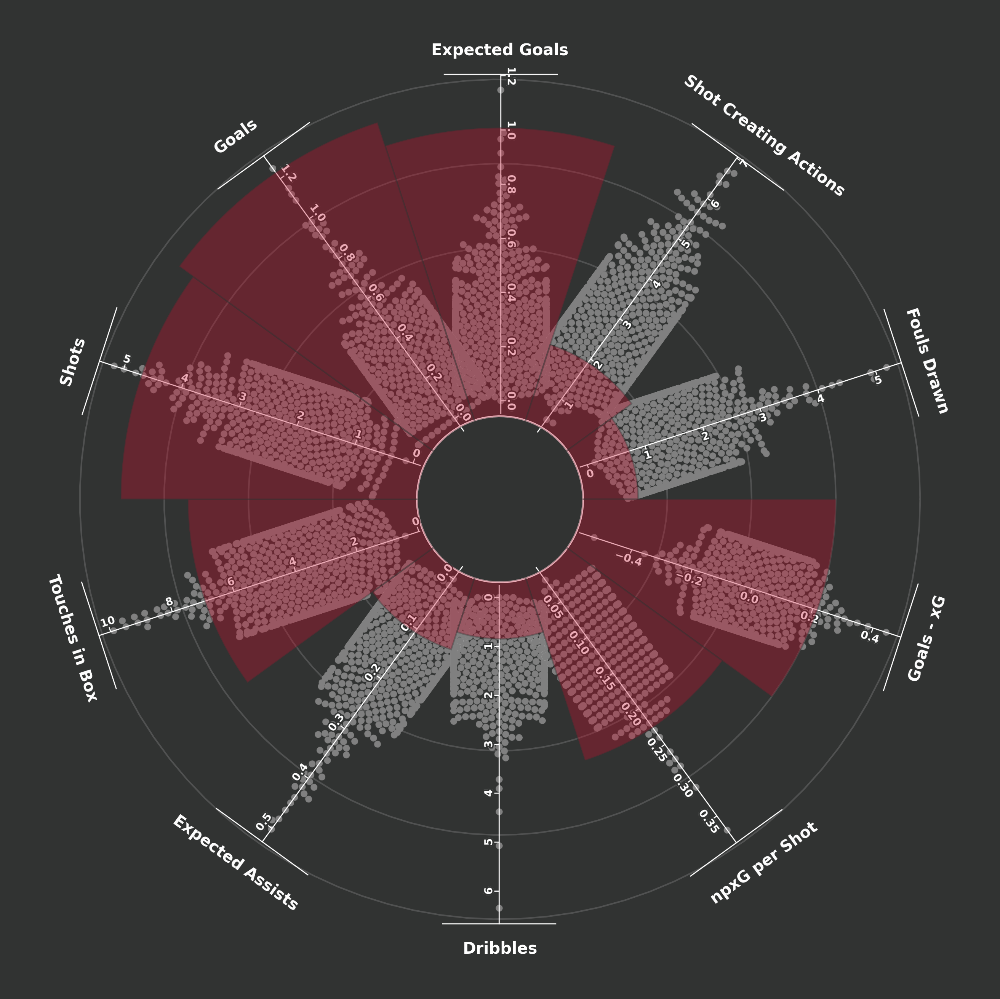

In [12]:
# 9. RADAR INDIVIDUAL SORLOTH
from viz.swarm_radar import create_player_radar
from IPython.display import Image as IPImage, display

if 'Sørloth' in player_data:
    sorloth_id = player_data['Sørloth']['id']
    
    print("Generando radar individual Sorloth...")
    create_player_radar(
        df_data=df_final,
        player_1_id=sorloth_id,
        player_2_id=None,
        metrics=fw_metrics,
        metric_titles=fw_titles,
        team_colors=['#C8102E', '#1A4FA0'],
        save_path='figures/sorloth_radar_individual.png',
        use_swarm=True,
        show_plot=False
    )
    print("✓ Radar guardado")
    display(IPImage('figures/sorloth_radar_individual.png'))
else:
    print("✗ Sorloth no encontrado")


Generando: Sorloth vs Haaland...
DEBUG Player 1 - Team: 'Atlético Madrid', team_logos keys: ['Atlético Madrid', 'Manchester City']
DEBUG P1 - Loading logo from: ../caras/atm/Sorloth.png
DEBUG P1 - Logo loaded successfully for Atlético Madrid
DEBUG Player 2 - Team: 'Manchester City', team_logos keys: ['Atlético Madrid', 'Manchester City']
DEBUG P2 - Loading logo from: ../caras/extras/Haaland.png
DEBUG P2 - Logo loaded successfully for Manchester City
✓ Completado


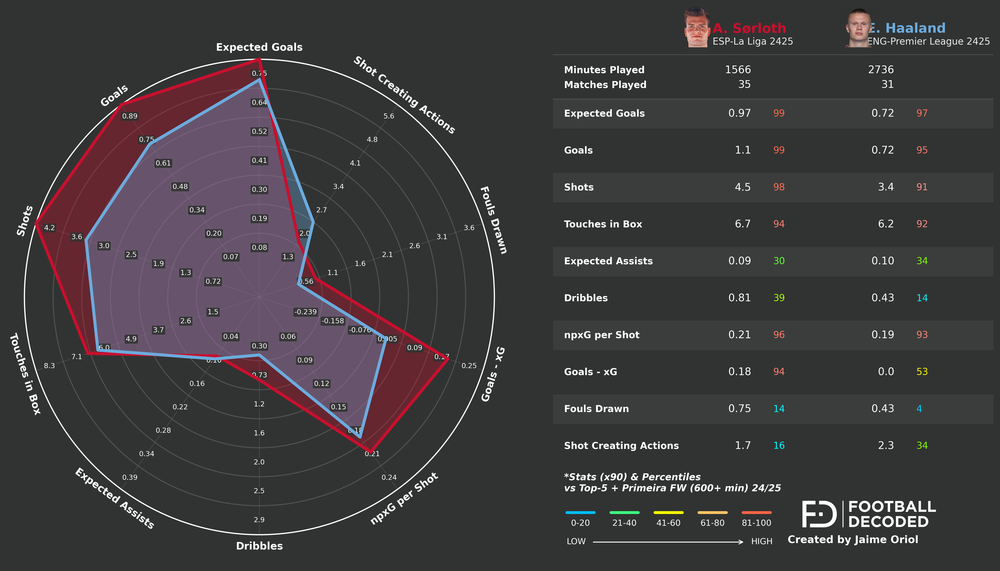


Generando: Sorloth vs Gyökeres...
DEBUG Player 1 - Team: 'Atlético Madrid', team_logos keys: ['Atlético Madrid', 'Sporting CP']
DEBUG P1 - Loading logo from: ../caras/atm/Sorloth.png
DEBUG P1 - Logo loaded successfully for Atlético Madrid
DEBUG Player 2 - Team: 'Sporting CP', team_logos keys: ['Atlético Madrid', 'Sporting CP']
DEBUG P2 - Loading logo from: ../caras/extras/Gyokeres.png
DEBUG P2 - Logo loaded successfully for Sporting CP
✓ Completado


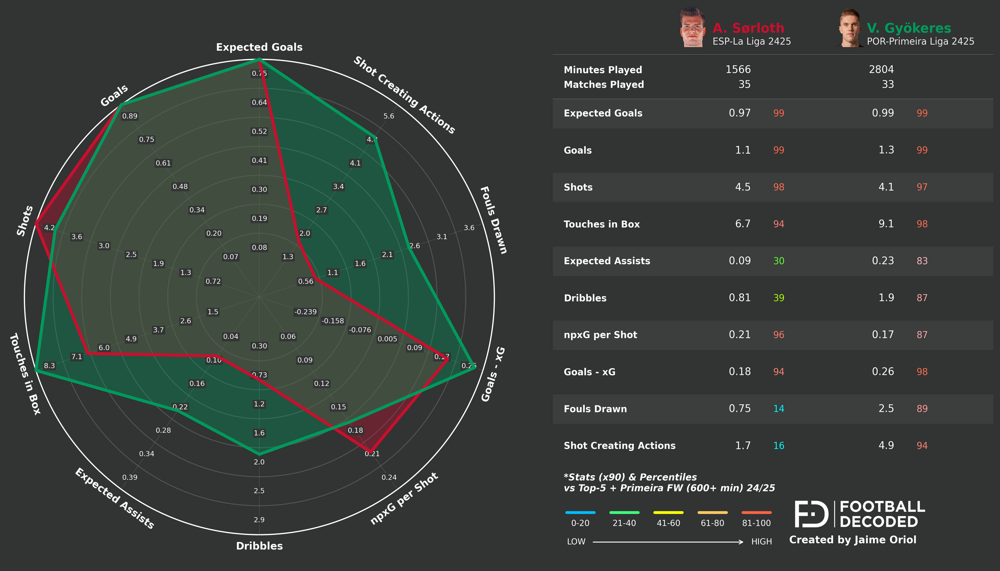


Generando: Sorloth vs Guirassy...
DEBUG Player 1 - Team: 'Atlético Madrid', team_logos keys: ['Atlético Madrid', 'Dortmund']
DEBUG P1 - Loading logo from: ../caras/atm/Sorloth.png
DEBUG P1 - Logo loaded successfully for Atlético Madrid
DEBUG Player 2 - Team: 'Dortmund', team_logos keys: ['Atlético Madrid', 'Dortmund']
DEBUG P2 - Loading logo from: ../caras/extras/Guirassy.png
DEBUG P2 - Logo loaded successfully for Dortmund
✓ Completado


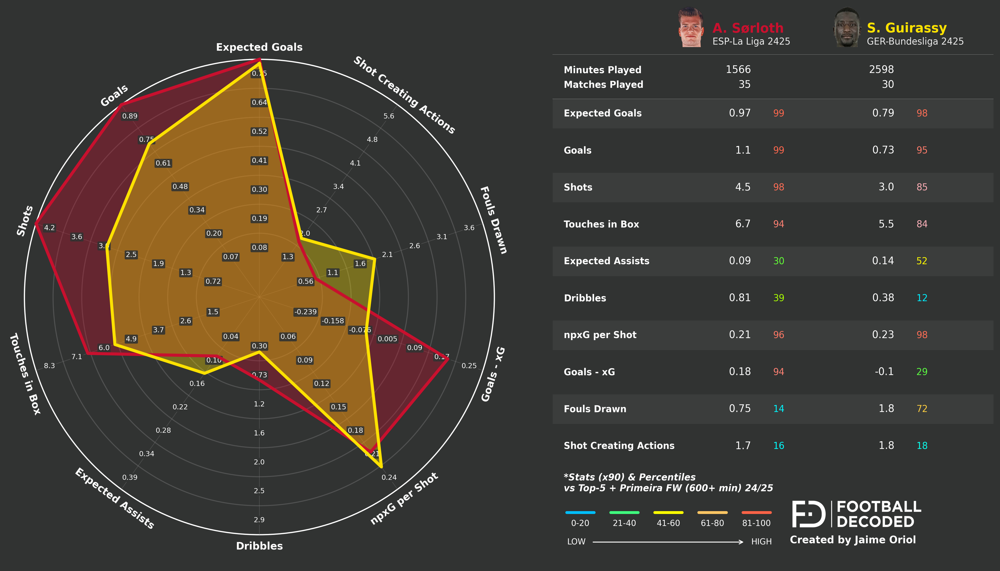


✓ Todos los radares completados


In [13]:
# 10. RADARES COMPARATIVOS
from viz.stats_radar import create_stats_table, combine_radar_and_table

comparisons = [
    ('Haaland', '#6CABDD'),
    ('Gyökeres', '#00995D'),
    ('Guirassy', '#FDE100')
]

if 'Sørloth' in player_data:
    sorloth_id = player_data['Sørloth']['id']
    
    for opponent, color in comparisons:
        if opponent in player_data:
            opponent_id = player_data[opponent]['id']
            
            print(f"\nGenerando: Sorloth vs {opponent}...")
            
            # Radar
            create_player_radar(
                df_data=df_final,
                player_1_id=sorloth_id,
                player_2_id=opponent_id,
                metrics=fw_metrics,
                metric_titles=fw_titles,
                team_colors=['#C8102E', color],
                save_path=f'figures/sorloth_vs_{opponent.lower()}_radar.png',
                use_swarm=False,
                show_plot=False
            )
            
            # Tabla
            create_stats_table(
                df_data=df_final,
                player_1_id=sorloth_id,
                player_2_id=opponent_id,
                metrics=fw_metrics,
                metric_titles=fw_titles,
                team_colors=['#C8102E', color],
                save_path=f'figures/sorloth_vs_{opponent.lower()}_table.png',
                team_logos={
                    player_data['Sørloth']['team']: player_data['Sørloth']['cara'],
                    player_data[opponent]['team']: player_data[opponent]['cara']
                },
                footer_text="Stats (x90) & Percentiles\nvs Top-5 + Primeira FW (600+ min) 24/25",
                show_plot=False
            )
            
            # Combinar
            combine_radar_and_table(
                radar_path=f'figures/sorloth_vs_{opponent.lower()}_radar.png',
                table_path=f'figures/sorloth_vs_{opponent.lower()}_table.png',
                output_path=f'figures/sorloth_vs_{opponent.lower()}_COMBINED.png'
            )
            
            print(f"✓ Completado")
            display(IPImage(f'figures/sorloth_vs_{opponent.lower()}_COMBINED.png'))
        else:
            print(f"✗ {opponent} no encontrado")

print("\n✓ Todos los radares completados")